In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install tslearn
import math
import pandas as pd
import plotly
import plotly.graph_objects as go
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (15,7)
from tslearn.metrics import dtw, dtw_path
from tslearn.generators import random_walks
from tslearn.clustering import TimeSeriesKMeans
from tslearn.preprocessing import TimeSeriesScalerMeanVariance
from tslearn import metrics
from scipy.spatial import distance
import numpy as np
from tslearn.metrics import dtw, dtw_path
from tslearn.clustering import TimeSeriesKMeans
from scipy.cluster.hierarchy import single, complete, average, ward, dendrogram
from scipy.cluster.hierarchy import fcluster
import numpy as np; np.random.seed(0)
import seaborn as sns; sns.set_theme()
from matplotlib.dates import DateFormatter
from sklearn.cluster import KMeans
from sklearn import metrics
from scipy.spatial.distance import cdist
from scipy.cluster import hierarchy
from scipy.optimize import linear_sum_assignment

     |████████████████████████████████| 798kB 16.3MB/s 


/usr/local/lib/python3.7/dist-packages/tslearn/clustering/kmeans.py:17: UserWarning:

Scikit-learn <0.24 will be deprecated in a future release of tslearn



In [ ]:
chhattisgarh_beds = pd.read_csv("/content/drive/MyDrive/Covid19ClusterPrediction/Chhattisgarh_Beds.csv")
delhi_beds = pd.read_csv("/content/drive/MyDrive/Covid19ClusterPrediction/Delhi_Beds.csv")
rajasthan_beds = pd.read_csv("/content/drive/MyDrive/Covid19ClusterPrediction/Rajasthan_Beds.csv")
ap_beds = pd.read_csv("/content/drive/MyDrive/Covid19ClusterPrediction/AP_Beds.csv")

NameError: ignored

In [ ]:
dataCT=chhattisgarh_beds.groupby("District Name").sum()

NameError: ignored

In [ ]:
dataCT["Value"]=dataCT["Total Beds Available"]/dataCT["Total Number Of covid Beds"]

In [ ]:
dataCT=dataCT["Value"]

In [ ]:
(pd.DataFrame(dataCT)).to_csv("datawrap")

In [ ]:
ap_beds=ap_beds[1:]
ap_beds.head()

,S.NO,District,No.of Hospitals,ICU Beds,Unnamed: 4,Unnamed: 5,O2 General Beds,Unnamed: 7,Unnamed: 8,General Beds,Unnamed: 10,Unnamed: 11,Ventilator,Unnamed: 13,Unnamed: 14
1,1,Anantapur,53.0,224,204,20,1316,1213,103,905,675,230,149,77,72
2,2,Chittoor,43.0,704,686,18,2545,2420,125,1761,1060,701,139,137,2
3,3,Y.s.r.,21.0,138,135,3,986,957,29,407,380,27,141,100,41
4,4,East godavari,52.0,602,535,67,2444,2373,71,1191,403,788,215,167,48
5,5,Guntur,107.0,1151,1057,94,3237,2980,257,1863,1233,630,358,218,140


In [ ]:
dataAP=(ap_beds["Unnamed: 5"].astype(int)+ap_beds["Unnamed: 8"].astype(int)+ap_beds["Unnamed: 11"].astype(int))/(ap_beds["ICU Beds"].astype(int)+ap_beds["O2 General Beds"].astype(int)+ap_beds["General Beds"].astype(int))

In [ ]:
dataAP.index=ap_beds["District"]

In [ ]:
dataAP=dataAP[:-1]

In [ ]:
dataAP

District
Anantapur         0.144376
Chittoor          0.168463
Y.s.r.            0.038537
East godavari     0.218551
Guntur            0.156935
Krishna           0.068062
Kurnool           0.233996
Spsr nellore      0.276052
Prakasam          0.126641
Srikakulam        0.147884
Visakhapatanam    0.224498
Vizianagaram      0.443784
West godavari     0.309704
dtype: float64

In [ ]:
rajasthan_beds=rajasthan_beds[1:]
rajasthan_beds

,District,General Beds,Unnamed: 2,Unnamed: 3,Oxygen Beds,Unnamed: 5,Unnamed: 6,ICU Beds without Ventilator,Unnamed: 8,Unnamed: 9,ICU Beds with Ventilator,Unnamed: 11,Unnamed: 12,Dist. Control Room No.
1,Ajmer,347,225,122,907,902,5,153,152,1,140,140,0,0145-2631111
2,Alwar,842,303,539,725,656,69,182,178,4,87,85,2,0144-2340145
3,Banswara,358,310,48,158,113,45,37,25,12,13,1,12,02962-251303
4,Baran,14,12,2,155,154,1,45,45,0,17,17,0,07453-230451
5,Barmer,251,100,151,568,544,24,27,9,18,20,16,4,02982 -230462
6,Bharatpur,50,9,41,356,318,38,51,41,10,29,19,10,05644-223660
7,Bhilwara,450,32,418,896,795,101,123,123,0,34,33,1,01482-232643
8,Bikaner,442,89,353,873,706,167,55,28,27,101,93,8,0151-2204989
9,Bundi,150,9,141,155,155,0,0,0,0,9,3,6,0747-2442895
10,Chittorgarh,150,100,50,256,256,0,13,9,4,25,25,0,01472-240088


In [ ]:
dataRJ=(rajasthan_beds["Unnamed: 3"].astype(int)+rajasthan_beds["Unnamed: 6"].astype(int)+rajasthan_beds["Unnamed: 9"].astype(int)+rajasthan_beds["Unnamed: 12"].astype(int))/(rajasthan_beds["General Beds"].astype(int)+rajasthan_beds["Oxygen Beds"].astype(int)+rajasthan_beds["ICU Beds without Ventilator"].astype(int)+rajasthan_beds["ICU Beds with Ventilator"].astype(int))

In [ ]:
dataRJ.index=rajasthan_beds["District"]

In [ ]:
dataRJ

District
Ajmer             0.082741
Alwar             0.334423
Banswara          0.206714
Baran             0.012987
Barmer            0.227483
Bharatpur         0.203704
Bhilwara          0.345975
Bikaner           0.377294
Bundi             0.468153
Chittorgarh       0.121622
Churu             0.253247
Dausa             0.226744
Dholpur           0.328125
Dungarpur         0.370130
Ganganagar        0.247740
Hanumangarh       0.195195
Jaipur            0.146209
Jaisalmer         0.559524
Jalore            0.276596
Jhalawar          0.116162
Jhunjhunu         0.436129
Jodhpur           0.093333
Karauli           0.195652
Kota              0.127001
Nagaur            0.146018
Pali              0.072881
Pratapgarh        0.252964
Rajsamand         0.466993
Sawai Madhopur    0.124242
Sikar             0.294038
Sirohi            0.684143
Tonk              0.348624
Udaipur           0.389708
dtype: float64

In [ ]:
pd.DataFrame(dataRJ).to_csv("RJ.csv")

In [ ]:
!pip install geopandas

     |████████████████████████████████| 1.0MB 31.0MB/s 
     |████████████████████████████████| 15.3MB 249kB/s 
     |████████████████████████████████| 6.5MB 18.5MB/s 
     |████████████████████████████████| 92kB 10.2MB/s 
  Found existing installation: click 8.0.0
    Uninstalling click-8.0.0:
      Successfully uninstalled click-8.0.0


In [ ]:
import geopandas as gpd

In [ ]:
district_map_df = gpd.read_file('/content/drive/MyDrive/Covid19ClusterPrediction/India_States_and_Districts/c44c9b96-f570-4ee3-97f1-ebad64efa4c2202044-1-1rb4x6s.8xx6.shp')
district_map_df.head()

,objectid,statecode,statename,state_ut,distcode,distname,st_area(sh,st_length(,countrynam,geometry
0,1,27,MAHARASHTRA,STATE,499,Jalgaon,1.353967e+10,8.464308e+05,India,"POLYGON ((75.23335 21.41481, 75.23469 21.41453..."
1,2,27,MAHARASHTRA,STATE,516,Nashik,1.771358e+10,9.720056e+05,India,"POLYGON ((74.13013 20.86311, 74.13215 20.86160..."
2,3,27,MAHARASHTRA,STATE,509,Chandrapur,1.294532e+10,7.410244e+05,India,"POLYGON ((79.75755 20.73462, 79.76047 20.73463..."
3,4,27,MAHARASHTRA,STATE,510,Yavatmal,1.547940e+10,1.014942e+06,India,"POLYGON ((78.26132 20.69735, 78.26276 20.69717..."
4,5,27,MAHARASHTRA,STATE,511,Nanded,1.186387e+10,1.131732e+06,India,"POLYGON ((78.05387 19.92452, 78.05449 19.92435..."


In [ ]:
district_map_df["distname"].iloc[417]="Raigad"

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
district_map_df[district_map_df['distname']=="Raigad"]

,objectid,statecode,statename,state_ut,distcode,distname,st_area(sh,st_length(,countrynam,geometry
417,418,27,MAHARASHTRA,STATE,520,Raigad,7.855354e+09,852475.083325,India,"POLYGON ((73.52538 19.12940, 73.52496 19.12858..."


In [ ]:
dist_ap=district_map_df[district_map_df["statename"]=="ANDHRA PRADESH"]
dist_ap=dist_ap[["distname",'geometry']].copy().rename(columns={"distname": "name"})
dist_ap=dist_ap.reset_index()
dist_ap.drop(labels="index",axis=1,inplace=True)

In [ ]:
dist_ap

,name,geometry
0,Srikakulam,"POLYGON ((84.67564 19.16769, 84.67566 19.16729..."
1,Visakhapatnam,"POLYGON ((82.48649 18.55033, 82.48728 18.55006..."
2,Krishna,"MULTIPOLYGON (((80.61371 17.13279, 80.61462 17..."
3,Guntur,"POLYGON ((80.10495 16.82230, 80.10540 16.82231..."
4,East Godavari,"MULTIPOLYGON (((81.98288 18.00505, 81.98330 18..."
5,Prakasam,"POLYGON ((79.53919 16.30075, 79.54027 16.29860..."
6,Kurnool,"POLYGON ((78.85472 16.14884, 78.85668 16.14859..."
7,Sri Potti Sriramulu Nell*,"POLYGON ((79.33586 15.11663, 79.33596 15.11652..."
8,West Godavari,"POLYGON ((81.00863 17.63325, 81.00844 17.63151..."
9,Vizianagaram,"POLYGON ((83.62492 19.16294, 83.62528 19.16260..."


In [ ]:
dataAP

District
Anantapur         0.144376
Chittoor          0.168463
Y.s.r.            0.038537
East godavari     0.218551
Guntur            0.156935
Krishna           0.068062
Kurnool           0.233996
Spsr nellore      0.276052
Prakasam          0.126641
Srikakulam        0.147884
Visakhapatanam    0.224498
Vizianagaram      0.443784
West godavari     0.309704
dtype: float64

In [ ]:
dists=set(dataAP.index)
dists

{'Anantapur',
 'Chittoor',
 'East godavari',
 'Guntur',
 'Krishna',
 'Kurnool',
 'Prakasam',
 'Spsr nellore',
 'Srikakulam',
 'Visakhapatanam',
 'Vizianagaram',
 'West godavari',
 'Y.s.r.'}

In [ ]:
arr=[0 for x in range(len(dist_ap))]
for i in range(len(arr)):
  if dist_ap["name"][i] in dists:
    arr[i]=dataAP[dist_ap["name"][i]]
  else:
    print(str(i)+" "+dist_ap["name"][i])

1 Visakhapatnam
4 East Godavari
7 Sri Potti Sriramulu Nell*
8 West Godavari
11 Y.S.R.


In [ ]:
arr[1]=0.224498
arr[4]=0.218551
arr[7]=0.276052
arr[8]=0.309704
arr[11]=0.038537
dist_ap["Ratio"]=arr
dist_ap

,name,geometry,Ratio
0,Srikakulam,"POLYGON ((84.67564 19.16769, 84.67566 19.16729...",0.147884
1,Visakhapatnam,"POLYGON ((82.48649 18.55033, 82.48728 18.55006...",0.224498
2,Krishna,"MULTIPOLYGON (((80.61371 17.13279, 80.61462 17...",0.068062
3,Guntur,"POLYGON ((80.10495 16.82230, 80.10540 16.82231...",0.156935
4,East Godavari,"MULTIPOLYGON (((81.98288 18.00505, 81.98330 18...",0.218551
5,Prakasam,"POLYGON ((79.53919 16.30075, 79.54027 16.29860...",0.126641
6,Kurnool,"POLYGON ((78.85472 16.14884, 78.85668 16.14859...",0.233996
7,Sri Potti Sriramulu Nell*,"POLYGON ((79.33586 15.11663, 79.33596 15.11652...",0.276052
8,West Godavari,"POLYGON ((81.00863 17.63325, 81.00844 17.63151...",0.309704
9,Vizianagaram,"POLYGON ((83.62492 19.16294, 83.62528 19.16260...",0.443784


In [ ]:
dist_rj=district_map_df[district_map_df["statename"]=="RAJASTHAN"]
dist_rj=dist_rj[["distname",'geometry']].copy().rename(columns={"distname": "name"})
dist_rj=dist_rj.reset_index()
dist_rj.drop(labels="index",axis=1,inplace=True)
dist_rj

,name,geometry
0,Churu,"POLYGON ((75.42740 28.99982, 75.42767 28.99955..."
1,Sikar,"POLYGON ((75.02761 28.20333, 75.02888 28.19995..."
2,Alwar,"POLYGON ((76.85008 28.22136, 76.85106 28.22117..."
3,Jaipur,"POLYGON ((76.08882 27.86035, 76.08889 27.86055..."
4,Jodhpur,"POLYGON ((72.04898 27.61588, 72.04946 27.61559..."
5,Bharatpur,"POLYGON ((77.04525 27.82140, 77.04557 27.82121..."
6,Nagaur,"POLYGON ((74.40347 27.69947, 74.40353 27.69936..."
7,Dausa,"POLYGON ((76.89436 27.23175, 76.89493 27.23147..."
8,Barmer,"POLYGON ((71.45226 26.51415, 71.45566 26.51010..."
9,Jhunjhunun,"POLYGON ((75.66998 28.51904, 75.67007 28.51772..."


In [ ]:
dists=set(dataRJ.index)
dists

{'Ajmer',
 'Alwar',
 'Banswara',
 'Baran',
 'Barmer',
 'Bharatpur',
 'Bhilwara',
 'Bikaner',
 'Bundi',
 'Chittorgarh',
 'Churu',
 'Dausa',
 'Dholpur',
 'Dungarpur',
 'Ganganagar',
 'Hanumangarh',
 'Jaipur',
 'Jaisalmer',
 'Jalore',
 'Jhalawar',
 'Jhunjhunu',
 'Jodhpur',
 'Karauli',
 'Kota',
 'Nagaur',
 'Pali',
 'Pratapgarh',
 'Rajsamand',
 'Sawai Madhopur',
 'Sikar',
 'Sirohi',
 'Tonk',
 'Udaipur'}

In [ ]:
len(dist_rj)==len(dataRJ)

True

In [ ]:
dataRJ

District
Ajmer             0.082741
Alwar             0.334423
Banswara          0.206714
Baran             0.012987
Barmer            0.227483
Bharatpur         0.203704
Bhilwara          0.345975
Bikaner           0.377294
Bundi             0.468153
Chittorgarh       0.121622
Churu             0.253247
Dausa             0.226744
Dholpur           0.328125
Dungarpur         0.370130
Ganganagar        0.247740
Hanumangarh       0.195195
Jaipur            0.146209
Jaisalmer         0.559524
Jalore            0.276596
Jhalawar          0.116162
Jhunjhunu         0.436129
Jodhpur           0.093333
Karauli           0.195652
Kota              0.127001
Nagaur            0.146018
Pali              0.072881
Pratapgarh        0.252964
Rajsamand         0.466993
Sawai Madhopur    0.124242
Sikar             0.294038
Sirohi            0.684143
Tonk              0.348624
Udaipur           0.389708
dtype: float64

In [ ]:
arr=[0 for x in range(len(dist_rj))]
for i in range(len(arr)):
  if dist_rj["name"][i] in dists:
    arr[i]=dataRJ[dist_rj["name"][i]]
  else:
    print(str(i)+" "+dist_rj["name"][i])

9 Jhunjhunun
12 Dhaulpur
27 Jalor
31 Chittaurgarh


In [ ]:
arr[9]=0.436129
arr[12]=0.328125
arr[27]=0.276596
arr[31]=0.121622
dist_rj["Ratio"]=arr
dist_rj

,name,geometry,Ratio
0,Churu,"POLYGON ((75.42740 28.99982, 75.42767 28.99955...",0.253247
1,Sikar,"POLYGON ((75.02761 28.20333, 75.02888 28.19995...",0.294038
2,Alwar,"POLYGON ((76.85008 28.22136, 76.85106 28.22117...",0.334423
3,Jaipur,"POLYGON ((76.08882 27.86035, 76.08889 27.86055...",0.146209
4,Jodhpur,"POLYGON ((72.04898 27.61588, 72.04946 27.61559...",0.093333
5,Bharatpur,"POLYGON ((77.04525 27.82140, 77.04557 27.82121...",0.203704
6,Nagaur,"POLYGON ((74.40347 27.69947, 74.40353 27.69936...",0.146018
7,Dausa,"POLYGON ((76.89436 27.23175, 76.89493 27.23147...",0.226744
8,Barmer,"POLYGON ((71.45226 26.51415, 71.45566 26.51010...",0.227483
9,Jhunjhunun,"POLYGON ((75.66998 28.51904, 75.67007 28.51772...",0.436129


In [ ]:
dist_ct=district_map_df[district_map_df["statename"]=="CHHATTISGARH"]
dist_ct=dist_ct[["distname",'geometry']].copy().rename(columns={"distname": "name"})
dist_ct=dist_ct.reset_index()
dist_ct.drop(labels="index",axis=1,inplace=True)
dist_ct

,name,geometry
0,Dakshin Bastar Dantewada,"POLYGON ((81.77323 18.67032, 81.77289 18.66989..."
1,Kondagaon,"POLYGON ((81.58475 20.19556, 81.58562 20.19392..."
2,Raipur,"POLYGON ((81.78565 21.62603, 81.78610 21.62564..."
3,Durg,"POLYGON ((81.35722 21.54431, 81.35803 21.54428..."
4,Mahasamund,"POLYGON ((82.87711 21.55634, 82.87892 21.55592..."
5,Uttar Bastar Kanker,"POLYGON ((81.32450 20.56283, 81.32583 20.56228..."
6,Narayanpur,"POLYGON ((80.85226 19.94461, 80.86469 19.94100..."
7,Bastar,"POLYGON ((81.86380 19.55200, 81.86534 19.55193..."
8,Gariaband,"POLYGON ((81.98918 21.08252, 81.99007 21.08150..."
9,Balod,"POLYGON ((81.15921 21.07825, 81.15921 21.07818..."


In [ ]:
dists=set(dataCT.index)
dists

{'BALOD',
 'BALODA BAJAR',
 'BALRAMPUR',
 'BASTAR',
 'BEMETARA',
 'BIJAPUR',
 'BILASPUR',
 'DHAMTARI',
 'DURG',
 'Dantewada',
 'GARIYABANDH',
 'Gorella Pendra Marwahi',
 'JANJGIR-CHAMPA',
 'JASHPUR',
 'KANKER',
 'KAWARDHA',
 'KONDAGAON',
 'KORBA',
 'KORIA',
 'MAHASAMUND',
 'MUNGELI',
 'NARAYANPUR',
 'RAIGARH',
 'RAIPUR',
 'RAJNANDGAON',
 'SUKMA',
 'SURAJPUR',
 'SURGUJA'}

In [ ]:
temp=set(x.upper() for x in dist_ct["name"])
temp

{'BALOD',
 'BALODA BAZAR',
 'BALRAMPUR',
 'BAMETARA',
 'BASTAR',
 'BIJAPUR',
 'BILASPUR',
 'DAKSHIN BASTAR DANTEWADA',
 'DHAMTARI',
 'DURG',
 'GARIABAND',
 'JANJGIR - CHAMPA',
 'JASHPUR',
 'KABEERDHAM',
 'KONDAGAON',
 'KORBA',
 'KORIYA',
 'MAHASAMUND',
 'MUNGELI',
 'NARAYANPUR',
 'RAIGARH',
 'RAIPUR',
 'RAJNANDGAON',
 'SUKMA',
 'SURAJPUR',
 'SURGUJA',
 'UTTAR BASTAR KANKER'}

In [ ]:
dists.difference(temp)

{'BALODA BAJAR',
 'BEMETARA',
 'Dantewada',
 'GARIYABANDH',
 'Gorella Pendra Marwahi',
 'JANJGIR-CHAMPA',
 'KANKER',
 'KAWARDHA',
 'KORIA'}

In [ ]:
arr=[0 for x in range(len(dist_ct))]
for i in range(len(arr)):
  if dist_ct["name"][i].upper() in dists:
    arr[i]=dataCT[dist_ct["name"][i].upper()]
  else:
    print(str(i)+" "+dist_ct["name"][i].upper())

0 DAKSHIN BASTAR DANTEWADA
5 UTTAR BASTAR KANKER
8 GARIABAND
11 JANJGIR - CHAMPA
13 BALODA BAZAR
19 KORIYA
22 KABEERDHAM
23 BAMETARA


In [ ]:
dataCT

District Name
BALOD                     0.265756
BALODA BAJAR              0.473378
BALRAMPUR                 0.782313
BASTAR                    0.639378
BEMETARA                  0.757437
BIJAPUR                   0.749398
BILASPUR                  0.378453
DHAMTARI                  0.469775
DURG                      0.522599
Dantewada                 0.614568
GARIYABANDH               0.592705
Gorella Pendra Marwahi    0.724390
JANJGIR-CHAMPA            0.581129
JASHPUR                   0.537500
KANKER                    0.552595
KAWARDHA                  0.706406
KONDAGAON                 0.818571
KORBA                     0.554930
KORIA                     0.356000
MAHASAMUND                0.621896
MUNGELI                   0.597458
NARAYANPUR                0.633333
RAIGARH                   0.186916
RAIPUR                    0.555437
RAJNANDGAON               0.539040
SUKMA                     0.475329
SURAJPUR                  0.590909
SURGUJA                   0.610581
Name: 

In [ ]:
arr[0]=0.614568
arr[5]=0.552595
arr[8]=0.592705
arr[11]=0.581129
arr[13]=0.473378
arr[19]=0.356000
arr[22]=0.555555 # demo value
arr[23]=0.757437
dist_ct["Ratio"]=arr
dist_ct

,name,geometry,Ratio
0,Dakshin Bastar Dantewada,"POLYGON ((81.77323 18.67032, 81.77289 18.66989...",0.614568
1,Kondagaon,"POLYGON ((81.58475 20.19556, 81.58562 20.19392...",0.818571
2,Raipur,"POLYGON ((81.78565 21.62603, 81.78610 21.62564...",0.555437
3,Durg,"POLYGON ((81.35722 21.54431, 81.35803 21.54428...",0.522599
4,Mahasamund,"POLYGON ((82.87711 21.55634, 82.87892 21.55592...",0.621896
5,Uttar Bastar Kanker,"POLYGON ((81.32450 20.56283, 81.32583 20.56228...",0.552595
6,Narayanpur,"POLYGON ((80.85226 19.94461, 80.86469 19.94100...",0.633333
7,Bastar,"POLYGON ((81.86380 19.55200, 81.86534 19.55193...",0.639378
8,Gariaband,"POLYGON ((81.98918 21.08252, 81.99007 21.08150...",0.592705
9,Balod,"POLYGON ((81.15921 21.07825, 81.15921 21.07818...",0.265756


In [ ]:
import xlrd
import random
import pandas as pd
import seaborn as sns
import geopandas as gpd
import matplotlib.pyplot as plt

sns.set_style('whitegrid')

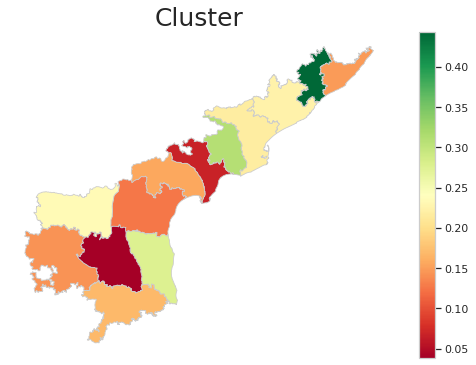

In [ ]:
fig, ax = plt.subplots(1, figsize=(10, 6))
ax.axis('off')
ax.set_title('Cluster', fontdict={'fontsize': '25', 'fontweight' : '3'})

# plot the figure
dist_ap.plot(column='Ratio', cmap='RdYlGn', linewidth=0.8, ax=ax, edgecolor='0.8', legend=True,)

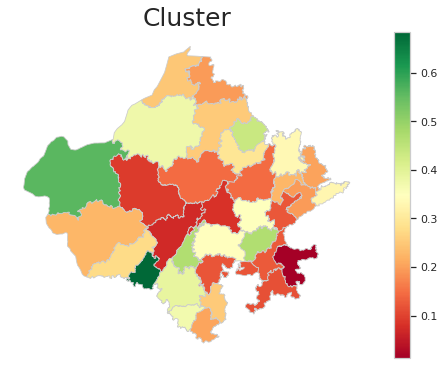

In [ ]:
fig, ax = plt.subplots(1, figsize=(10, 6))
ax.axis('off')
ax.set_title('Cluster', fontdict={'fontsize': '25', 'fontweight' : '3'})

# plot the figure
dist_rj.plot(column='Ratio', cmap='RdYlGn', linewidth=0.8, ax=ax, edgecolor='0.8', legend=True,)

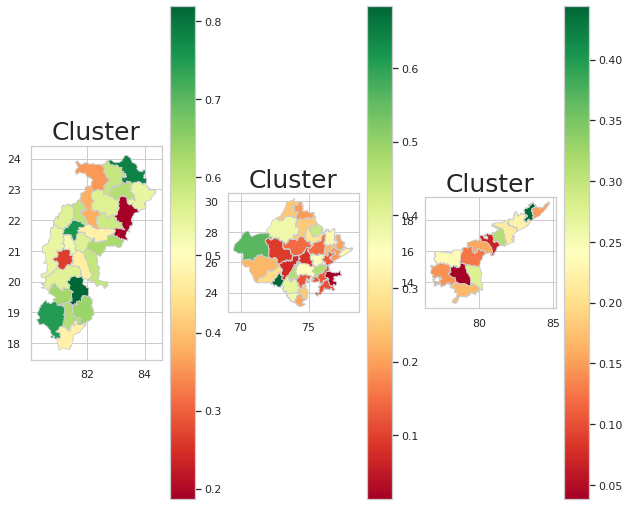

In [ ]:
# fig, ax = plt.subplots(1, figsize=(10, 6))
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(10, 10))
# ax.axis('off')
ax1.set_title('Cluster', fontdict={'fontsize': '25', 'fontweight' : '3'})
ax2.set_title('Cluster', fontdict={'fontsize': '25', 'fontweight' : '3'})
ax3.set_title('Cluster', fontdict={'fontsize': '25', 'fontweight' : '3'})

# plot the figure
dist_ct.plot(column='Ratio', cmap='RdYlGn', linewidth=0.8, ax=ax1, edgecolor='0.8', legend=True,)
dist_rj.plot(column='Ratio', cmap='RdYlGn', linewidth=0.8, ax=ax2, edgecolor='0.8', legend=True,)
dist_ap.plot(column='Ratio', cmap='RdYlGn', linewidth=0.8, ax=ax3, edgecolor='0.8', legend=True,)
plt.subplots_adjust(right=0.9)
plt.show()

In [ ]:
import pandas as pd
import numpy as np
import math

import geopandas as gpd
import json

from bokeh.io import output_notebook, show, output_file
output_notebook()
from bokeh.plotting import figure
from bokeh.models import GeoJSONDataSource, LinearColorMapper, ColorBar, NumeralTickFormatter
from bokeh.palettes import brewer

from bokeh.io.doc import curdoc
from bokeh.models import Slider, HoverTool, Select
from bokeh.layouts import widgetbox, row, column

In [ ]:
merged_json = json.loads(dist_ap.to_json())

#Convert to str like object
json_data = json.dumps(merged_json)
geosource = GeoJSONDataSource(geojson = json_data)


#Define a sequential multi-hue color palette.
# palette = brewer['RdYlGn'][8]
# #Reverse color order so that dark blue is highest obesity.
# palette = palette[::-1]
palette = ['red','orange','yellow', 'purple', 'pink', 'green']
#Instantiate LinearColorMapper that linearly maps numbers in a range, into a sequence of colors. Input nan_color.
color_mapper = LinearColorMapper(palette = palette, low = dist_ap['Ratio'].min(), high = dist_ap['Ratio'].max(), nan_color = '#d9d9d9')
#Define custom tick labels for color bar.
# tick_labels = {'5000': '>5000'}

#Add hover tool
hover = HoverTool(tooltips = [ ('Name','@name'),('Ratio','@Ratio')])
#Create color bar.
color_bar = ColorBar(color_mapper=color_mapper, label_standoff=8,width = 500, height = 20,
                     border_line_color=None,location = (0,0), orientation = 'horizontal')
#Create figure object.
pp = figure(title = 'Ratio of Avaiable to Total Beds', plot_height = 800 , plot_width = 850, toolbar_location = None, tools = [hover])
pp.xaxis.visible = False
pp.yaxis.visible = False
pp.xgrid.grid_line_color = None
pp.ygrid.grid_line_color = None
#Add patch renderer to figure.
pp.patches('xs','ys', source = geosource,fill_color = {'field' :'Ratio', 'transform' : color_mapper},
          line_color = 'black', line_width = 0.25, fill_alpha = 1)
#Specify layout
pp.add_layout(color_bar, 'below')

output_file("foo.html")
#Display plot
show(pp)

In [ ]:
merged_json = json.loads(dist_rj.to_json())

#Convert to str like object
json_data = json.dumps(merged_json)
geosource = GeoJSONDataSource(geojson = json_data)


#Define a sequential multi-hue color palette.
# palette = brewer['RdYlGn'][8]
# #Reverse color order so that dark blue is highest obesity.
# palette = palette[::-1]
palette = ['red','orange','yellow', 'purple', 'pink', 'green']
#Instantiate LinearColorMapper that linearly maps numbers in a range, into a sequence of colors. Input nan_color.
color_mapper = LinearColorMapper(palette = palette, low = dist_rj['Ratio'].min(), high = dist_rj['Ratio'].max(), nan_color = '#d9d9d9')
#Define custom tick labels for color bar.
# tick_labels = {'5000': '>5000'}

#Add hover tool
hover = HoverTool(tooltips = [ ('Name','@name'),('Ratio','@Ratio')])
#Create color bar.
color_bar = ColorBar(color_mapper=color_mapper, label_standoff=8,width = 500, height = 20,
                     border_line_color=None,location = (0,0), orientation = 'horizontal')
#Create figure object.
pp = figure(title = 'Ratio of Avaiable to Total Beds', plot_height = 800 , plot_width = 850, toolbar_location = None, tools = [hover])
pp.xaxis.visible = False
pp.yaxis.visible = False
pp.xgrid.grid_line_color = None
pp.ygrid.grid_line_color = None
#Add patch renderer to figure.
pp.patches('xs','ys', source = geosource,fill_color = {'field' :'Ratio', 'transform' : color_mapper},
          line_color = 'black', line_width = 0.25, fill_alpha = 1)
#Specify layout
pp.add_layout(color_bar, 'below')

output_file("foo.html")
#Display plot
show(pp)

In [ ]:
merged_json = json.loads(dist_ct.to_json())

#Convert to str like object
json_data = json.dumps(merged_json)
geosource = GeoJSONDataSource(geojson = json_data)


#Define a sequential multi-hue color palette.
# palette = brewer['RdYlGn'][8]
# #Reverse color order so that dark blue is highest obesity.
# palette = palette[::-1]
palette = ['red','orange','yellow', 'purple', 'pink', 'blue', 'green']
#Instantiate LinearColorMapper that linearly maps numbers in a range, into a sequence of colors. Input nan_color.
color_mapper = LinearColorMapper(palette = palette, low = dist_ct['Ratio'].min(), high = dist_ct['Ratio'].max(), nan_color = '#d9d9d9')
#Define custom tick labels for color bar.
# tick_labels = {'5000': '>5000'}

#Add hover tool
hover = HoverTool(tooltips = [ ('Name','@name'),('Ratio','@Ratio')])
#Create color bar.
color_bar = ColorBar(color_mapper=color_mapper, label_standoff=8,width = 500, height = 20,
                     border_line_color=None,location = (0,0), orientation = 'horizontal')
#Create figure object.
pp = figure(title = 'Ratio of Avaiable to Total Beds', plot_height = 800 , plot_width = 850, toolbar_location = None, tools = [hover])
pp.xaxis.visible = False
pp.yaxis.visible = False
pp.xgrid.grid_line_color = None
pp.ygrid.grid_line_color = None
#Add patch renderer to figure.
pp.patches('xs','ys', source = geosource,fill_color = {'field' :'Ratio', 'transform' : color_mapper},
          line_color = 'black', line_width = 0.25, fill_alpha = 1)
#Specify layout
pp.add_layout(color_bar, 'below')

output_file("foo.html")
#Display plot
show(pp)

1. Very few abrupt changes are observed in the behaviour of any of the states, hence the transition of the states are mostly smooth.
2. Delhi unlike most of the other states, shows more than 2 distict waves.
3. Madhya Pradesh and Gujarat handled the second wave noticeably well compared to first wave, in their relative performances with other states.
4. Haryana and Chattisgarh performed poorly in second wave compared to their respective performance in the first wave, relative to the other states.

1. Some states showed abrupt transition in their relative ranks. They may have performed very well compared to other states in a particular period of time whereas in the next period they did so poorly or vice versa.
2. Punjab, Chattisgarh and West Bengal had a relatively poor perforamce compared to other states in the beginning of the second wave than that in the beginning of the first wave.
3. It is really hard to distinguish between the end of the first wave and the beginning of the second, by looking at Chattisgarh. Chattisgarh did not have any severe impact in the first few months of first wave, later the situation worsened, whereas it was one of the states to get badly affected in the first few days of second wave, so before the number of cases of first wave could fall, it stated to rise again as the result of second wave.
4. ** Rajasthan and Andhra Pradesh had a relatively better perforamce compared to other states in the beginning of the second wave than that in the beginning of the first wave.